In [1]:
################################################################################
####################    Regression: Regularization    #######################
################################################################################
### Load necessary modules -------------------------------
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
plt.style.use('ggplot')
from sklearn.feature_selection import RFECV
import RegressionTools as RT
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression, PLSSVD
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn import set_config
set_config(display='diagram')

In [2]:
### Load file --------------------------------------------
dfINI = pd.read_csv('TemperaturesSpainSmall.csv', sep = ";")
dfTOT = dfINI.iloc[1:1000].dropna(axis=0, how='any')
dfTOT.head()

,DAY,MONTH,YEAR,WEEKDAY,TMIN229,TMIN230,TMIN231,TMIN232,TMIN234,TMIN236,...,TMAX3948,TMAX3949,TMAX3950,TMAX3951,TMAX3952,TMAX3954,TMAX3959,TMAX3967,TMAX3971,TMAX11034
1,2,1,1990,3,3.6,5.6,7.0,-3.4,6.0,6.9,...,7.6,18.4,11.4,11.4,11.4,12.0,20.8,8.9,12.0,14.2
2,3,1,1990,4,6.0,4.9,8.8,-4.2,8.6,4.6,...,10.4,12.8,9.0,12.2,12.2,10.0,19.2,10.6,9.0,11.6
3,4,1,1990,5,3.8,2.5,8.6,-6.6,8.2,7.8,...,11.8,13.5,8.2,9.4,9.4,9.4,19.6,12.0,7.0,14.6
4,5,1,1990,6,7.0,3.4,7.4,-3.2,8.0,3.8,...,11.0,15.3,5.8,14.8,14.8,13.0,19.6,10.7,10.6,14.4
5,6,1,1990,7,7.0,2.6,8.8,-1.4,8.0,4.2,...,6.6,16.2,5.0,12.4,12.4,11.4,21.5,8.0,11.6,13.8


In [3]:
dfTOT.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 999 entries, 1 to 999
Data columns (total 96 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   DAY        999 non-null    int64  
 1   MONTH      999 non-null    int64  
 2   YEAR       999 non-null    int64  
 3   WEEKDAY    999 non-null    int64  
 4   TMIN229    999 non-null    float64
 5   TMIN230    999 non-null    float64
 6   TMIN231    999 non-null    float64
 7   TMIN232    999 non-null    float64
 8   TMIN234    999 non-null    float64
 9   TMIN236    999 non-null    float64
 10  TMIN237    999 non-null    float64
 11  TMIN238    999 non-null    float64
 12  TMIN414    999 non-null    float64
 13  TMIN416    999 non-null    float64
 14  TMIN417    999 non-null    float64
 15  TMIN421    999 non-null    float64
 16  TMIN422    999 non-null    float64
 17  TMIN1389   999 non-null    float64
 18  TMIN1392   999 non-null    float64
 19  TMIN1396   999 non-null    float64
 20  TMIN1397  

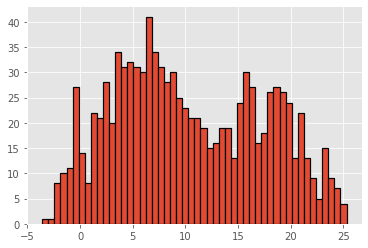

In [4]:
# Output variable (TMIN MADRID-RETIRO)
plt.hist(x=dfTOT.TMIN230, bins=50, edgecolor='black', linewidth=1.2)
plt.show()

In [5]:
# Subsets variables
df = dfTOT[["WEEKDAY","MONTH","TMIN230","TMAX230","TMAX229","TMAX237","TMAX417","TMAX2969","TMAX3910","TMAX3918","TMAX3959"]]
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 999 entries, 1 to 999
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   WEEKDAY   999 non-null    int64  
 1   MONTH     999 non-null    int64  
 2   TMIN230   999 non-null    float64
 3   TMAX230   999 non-null    float64
 4   TMAX229   999 non-null    float64
 5   TMAX237   999 non-null    float64
 6   TMAX417   999 non-null    float64
 7   TMAX2969  999 non-null    float64
 8   TMAX3910  999 non-null    float64
 9   TMAX3918  999 non-null    float64
 10  TMAX3959  999 non-null    float64
dtypes: float64(9), int64(2)
memory usage: 93.7 KB


In [6]:
### Convert necessary variable to factor
df.WEEKDAY = df.WEEKDAY.astype('category')
df.MONTH = df.MONTH.astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 999 entries, 1 to 999
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   WEEKDAY   999 non-null    category
 1   MONTH     999 non-null    category
 2   TMIN230   999 non-null    float64 
 3   TMAX230   999 non-null    float64 
 4   TMAX229   999 non-null    float64 
 5   TMAX237   999 non-null    float64 
 6   TMAX417   999 non-null    float64 
 7   TMAX2969  999 non-null    float64 
 8   TMAX3910  999 non-null    float64 
 9   TMAX3918  999 non-null    float64 
 10  TMAX3959  999 non-null    float64 
dtypes: category(2), float64(9)
memory usage: 80.8 KB


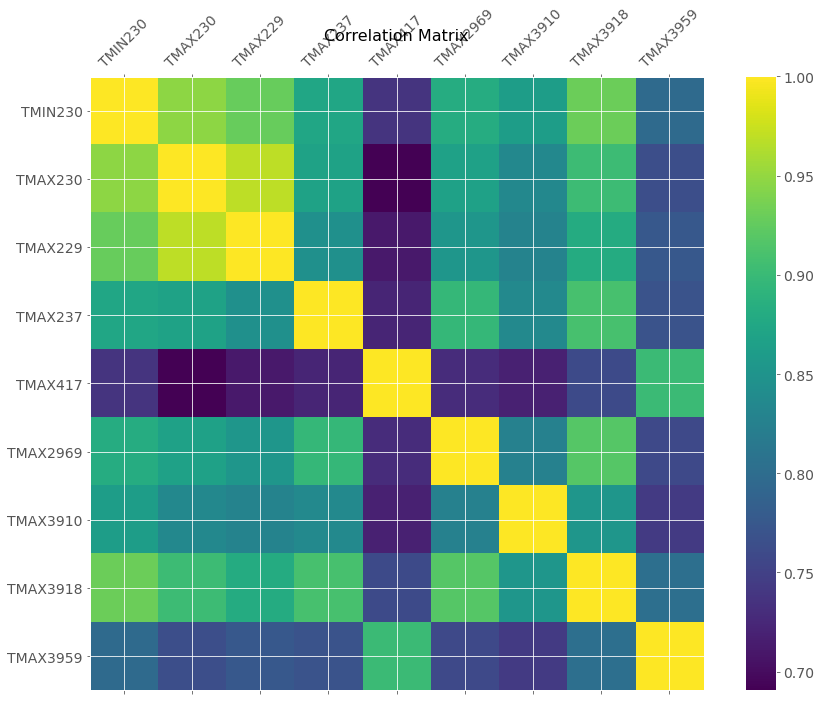

In [7]:
#correlation plot of numeric variables
f = plt.figure(figsize=(15, 11))
plt.matshow(df.select_dtypes(include=['int64','float64']).corr(), fignum=f.number)
plt.xticks(range(df.select_dtypes(include=['int64','float64']).shape[1]), df.select_dtypes(include=['int64','float64']).columns, fontsize=14, rotation=45)
plt.yticks(range(df.select_dtypes(include=['int64','float64']).shape[1]), df.select_dtypes(include=['int64','float64']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)
plt.show()

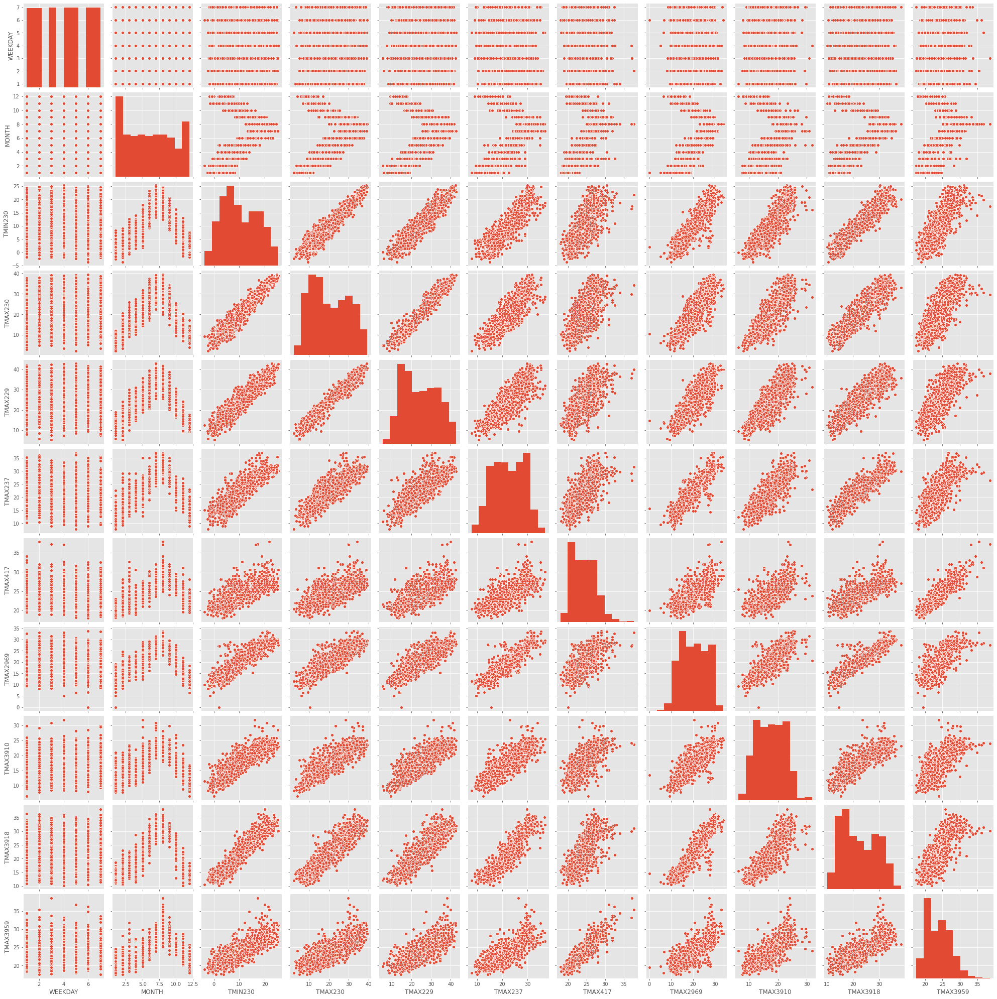

In [8]:
### Exploratory analysis -------------------------------------------------------------------------------------
sns.pairplot(df, vars=df.columns.values.tolist())
plt.show()

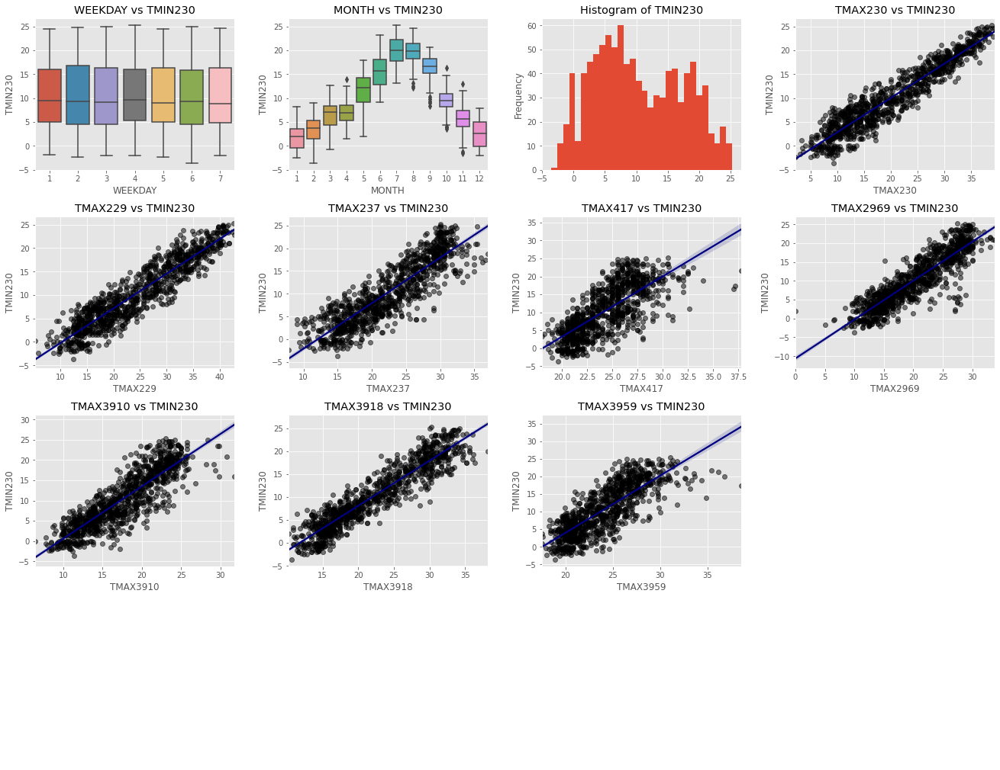

In [9]:
#To analyze in greater detail the relation between inputs and output, use PlotDataframe function
RT.PlotDataframe(df, 'TMIN230')

In [10]:
X = df.loc[:, df.columns != 'TMIN230']
y = df['TMIN230']
## Divide the data into training and test sets ---------------------------------------------------
## Create random 80/20 % split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 5)

## Create dataset to store model predictions
dfTR_eval = X_train.copy()
dfTR_eval['TMIN230'] = y_train
dfTS_eval = X_test.copy()
dfTS_eval['TMIN230'] = y_test

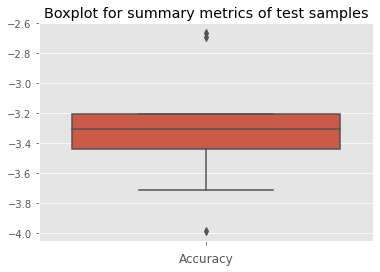

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['TMAX230',
                                                                          'TMAX229',
                                                                          'TMAX237',
                                                                          'TMAX417',
                                                                          'TMAX2969',
                                                                          'TMAX3910',
                                                                          'TMAX3918',
                                                                          'TMAX3959']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['WEEKDAY',
                                                                          'MONTH'])])),
                                       ('LR_model', LinearRegression())]),
             n_jobs=-1, param_grid={}, scoring='neg_mean_squared_error')

In [11]:
#-------------------------------------------------------------------------------------------------
#------------------------------- Linear Regression MODEL -----------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
# numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = X_train.select_dtypes(include=['category']).columns.values.tolist()
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])

param = {} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('LR_model', LinearRegression())
        ])
# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
LR_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
LR_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(LR_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = LR_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_LR1 = meanAcc # Store cv-scores for later

ax = sns.boxplot(y=cv_errors).set_title('Boxplot for summary metrics of test samples')
plt.xlabel('Accuracy')
plt.show()
LR_fit

In [12]:
RT.summaryLinReg(LR_fit.best_estimator_, X_train[numeric_features + categorical_features], y_train)  #information about the model trained

Residuals:
        Min        1Q    Median       3Q       Max
0 -5.254395 -1.205908  0.009229  1.27395  4.422021

Coefficients:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.934
Model:                            OLS   Adj. R-squared:                  0.932
Method:                 Least Squares   F-statistic:                     437.6
Date:                Tue, 18 Aug 2020   Prob (F-statistic):               0.00
Time:                        20:30:47   Log-Likelihood:                -1581.4
No. Observations:                 799   AIC:                             3215.
Df Residuals:                     773   BIC:                             3336.
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---

In [13]:
# Identify correlated variables
X_processed = LR_fit.best_estimator_[0].transform(X_train)
if X_train.select_dtypes('category').shape[1] > 0:
    column_init = X_train.select_dtypes(exclude='category').shape[1]
    input_names = []
    for cat_input in X_train.select_dtypes('category').columns:
        input_names += [cat_input + str(cat) for cat in X_train[cat_input].unique()]
        input_names.pop()
        X_processed = np.delete(X_processed,column_init+len(input_names),1)
    coefnames = X_train.select_dtypes(exclude='category').columns.values.tolist() + input_names
else:
    coefnames = X_train.columns.values.tolist()
#Identify correlated variables
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_processed, i) for i in range(X_processed.shape[1])]
vif["features"] = coefnames
vif.round(1)
#No vif>10, there is not multicolineality present in the model

,VIF Factor,features
0,25.2,TMAX230
1,20.1,TMAX229
2,7.2,TMAX237
3,6.1,TMAX417
4,8.5,TMAX2969
5,4.6,TMAX3910
6,12.6,TMAX3918
7,7.4,TMAX3959
8,1.8,WEEKDAY1
9,1.8,WEEKDAY6


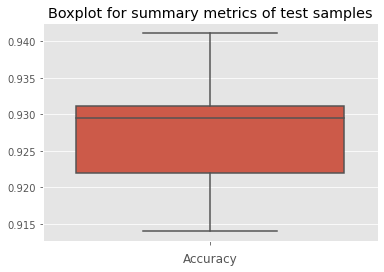

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['TMAX230',
                                                                          'TMAX229',
                                                                          'TMAX237',
                                                                          'TMAX417',
                                                                          'TMAX2969',
                                                                          'TMAX3910',
                                                                          'TMAX3918',
                                                                          'TMAX3959']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['WEEKDAY',
                                                                          'MONTH'])])),
                                       ('selector',
                                        RFECV(cv=10,
                                              estimator=LinearRegression()))]),
             n_jobs=-1, param_grid={})

In [14]:
#################################################################################################
###################### LINEAR REGRESSION -MODEL SELECTION #######################################
#################################################################################################
# Prepare the numeric variables by imputing by its median and scaling
# numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = X_train.select_dtypes(include=['category']).columns.values.tolist()
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])

nFolds = 10
param = {} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('selector', RFECV(LinearRegression(),step=1, cv=nFolds)) # We use Recursive Feature Elimination to select best inputs
        ])
# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
RFE_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       cv=nFolds) # Number of Folds 
RFE_fit.fit(X_train, y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(RFE_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = RFE_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_RFE = meanAcc # Store cv-scores for later

ax = sns.boxplot(y=cv_errors).set_title('Boxplot for summary metrics of test samples')
plt.xlabel('Accuracy')
plt.show()
RFE_fit

In [15]:
# Summarize all features
# Obtain the name of all the features used as inputs
inputs = numeric_features + categorical_features
if X_train.select_dtypes('category').shape[1] > 0:
	input_names = []
	for cat_input in X_train.select_dtypes('category').columns:
		input_names += [cat_input + str(cat) for cat in X_train[cat_input].unique()]
	coefnames = X_train.select_dtypes(exclude='category').columns.values.tolist() + input_names
else:
	coefnames = X_train.columns.values.tolist()

for i in range(len(coefnames)):
	print('Column: %s, Selected %s, Rank: %.3f' % (coefnames[i], RFE_fit.best_estimator_.named_steps['selector'].support_[i], RFE_fit.best_estimator_.named_steps['selector'].ranking_[i]))

Column: TMAX230, Selected True, Rank: 1.000
Column: TMAX229, Selected False, Rank: 4.000
Column: TMAX237, Selected True, Rank: 1.000
Column: TMAX417, Selected False, Rank: 6.000
Column: TMAX2969, Selected False, Rank: 10.000
Column: TMAX3910, Selected True, Rank: 1.000
Column: TMAX3918, Selected True, Rank: 1.000
Column: TMAX3959, Selected True, Rank: 1.000
Column: WEEKDAY1, Selected False, Rank: 3.000
Column: WEEKDAY6, Selected True, Rank: 1.000
Column: WEEKDAY2, Selected False, Rank: 5.000
Column: WEEKDAY3, Selected False, Rank: 7.000
Column: WEEKDAY4, Selected False, Rank: 8.000
Column: WEEKDAY7, Selected True, Rank: 1.000
Column: WEEKDAY5, Selected True, Rank: 1.000
Column: MONTH2, Selected True, Rank: 1.000
Column: MONTH9, Selected True, Rank: 1.000
Column: MONTH4, Selected False, Rank: 2.000
Column: MONTH8, Selected True, Rank: 1.000
Column: MONTH5, Selected True, Rank: 1.000
Column: MONTH10, Selected True, Rank: 1.000
Column: MONTH7, Selected True, Rank: 1.000
Column: MONTH3, Se

In [16]:
# Which of the features are used
[coefnames[i] for i in range(RFE_fit.best_estimator_.named_steps['selector'].support_.shape[0]) if RFE_fit.best_estimator_.named_steps['selector'].support_[i]]

['TMAX230',
 'TMAX237',
 'TMAX3910',
 'TMAX3918',
 'TMAX3959',
 'WEEKDAY6',
 'WEEKDAY7',
 'WEEKDAY5',
 'MONTH2',
 'MONTH9',
 'MONTH8',
 'MONTH5',
 'MONTH10',
 'MONTH7',
 'MONTH3',
 'MONTH11',
 'MONTH1',
 'MONTH12']

In [17]:
# Identify correlated variables
X_processed = RFE_fit.best_estimator_[0].transform(X_train)
X_processed = X_processed[:,RFE_fit.best_estimator_.named_steps['selector'].support_]
#Identify correlated variables
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_processed, i) for i in range(X_processed.shape[1])]
vif["features"] = [coefnames[i] for i in range(RFE_fit.best_estimator_.named_steps['selector'].support_.shape[0]) if RFE_fit.best_estimator_.named_steps['selector'].support_[i]]
vif.round(1)
#No vif>10, there is not multicolineality present in the model

,VIF Factor,features
0,9.2,TMAX230
1,6.5,TMAX237
2,4.5,TMAX3910
3,9.2,TMAX3918
4,3.6,TMAX3959
5,1.2,WEEKDAY6
6,1.2,WEEKDAY7
7,1.2,WEEKDAY5
8,1.7,MONTH2
9,1.4,MONTH9


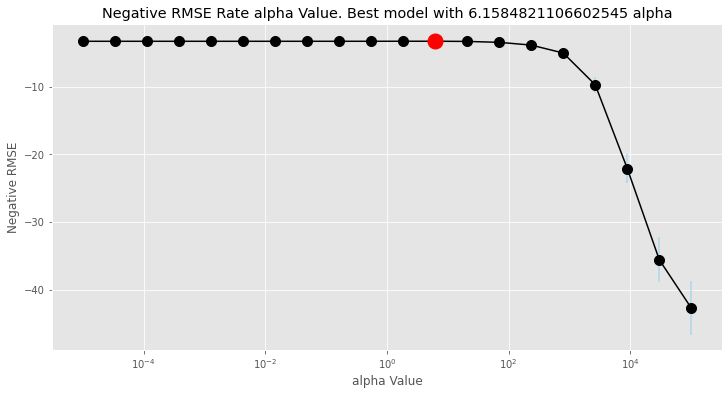

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['TMAX230',
                                                                          'TMAX229',
                                                                          'TMAX237',
                                                                          'TMAX417',
                                                                          'TMAX2969',
                                                                          'TMAX3910',
                                                                          'TMAX3918',
                                                                          'TMAX3959']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        str...
             param_grid={'Ridge_model__alpha': array([1.00000000e-05, 3.35981829e-05, 1.12883789e-04, 3.79269019e-04,
       1.27427499e-03, 4.28133240e-03, 1.43844989e-02, 4.83293024e-02,
       1.62377674e-01, 5.45559478e-01, 1.83298071e+00, 6.15848211e+00,
       2.06913808e+01, 6.95192796e+01, 2.33572147e+02, 7.84759970e+02,
       2.63665090e+03, 8.85866790e+03, 2.97635144e+04, 1.00000000e+05])},
             scoring='neg_mean_squared_error')

In [18]:
#-------------------------------------------------------------------------------------------------
#-------------------------------- Ridge Regression MODEL -----------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
# numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = X_train.select_dtypes(include=['category']).columns.values.tolist()
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])

param = {'Ridge_model__alpha':np.logspace(-5, 5, 20)} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('Ridge_model', Ridge())
        ])
# As we want to know how the coefficients evolve with alpha, we have to do the grid ourselves first
nFolds = 10
coefs = []
for alpha in param['Ridge_model__alpha']:
    param_iter = {'Ridge_model__alpha': [alpha]}
    Ridge_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                        param_grid=param_iter, # Defined grid to search in
                        n_jobs=-1, # Number of cores to use (parallelize)
                        scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                        cv=nFolds) # Number of Folds 
    Ridge_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid
    coefs.append(Ridge_fit.best_estimator_[1].coef_)

# Train the model with the whole grid in order to obtain the cross validation errors easily
Ridge_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
Ridge_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(Ridge_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = Ridge_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_Ridge = meanAcc # Store cv-scores for later

plt.figure(figsize=(12, 6))
plt.plot(Ridge_fit.cv_results_['param_Ridge_model__alpha'], meanAcc, marker='o', markersize=10, color='black')
plt.errorbar(Ridge_fit.cv_results_['param_Ridge_model__alpha'], meanAcc, yerr=stdAcc, linestyle="None", ecolor='lightblue')
plt.plot(Ridge_fit.best_params_['Ridge_model__alpha'], Ridge_fit.best_score_,marker='o', markersize=15, color='red')
plt.title('Negative RMSE Rate alpha Value. Best model with ' + str(Ridge_fit.best_params_['Ridge_model__alpha']) + ' alpha')
plt.xlabel('alpha Value')
plt.ylabel('Negative RMSE')
plt.xscale('log')
plt.show()
Ridge_fit

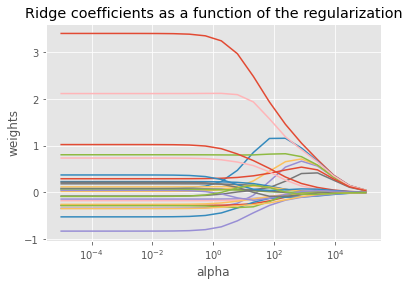

In [19]:
# Plot evolution of coefficients with different values of alpha
ax = plt.gca()
ax.plot(param['Ridge_model__alpha'], coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Ridge coefficients as a function of the regularization')
plt.axis('tight')
plt.show()

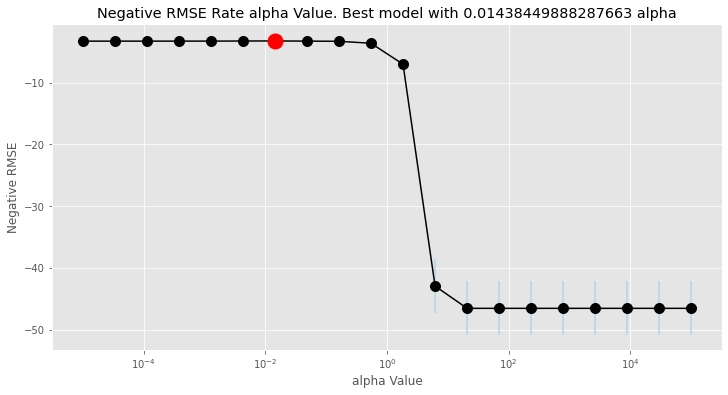

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['TMAX230',
                                                                          'TMAX229',
                                                                          'TMAX237',
                                                                          'TMAX417',
                                                                          'TMAX2969',
                                                                          'TMAX3910',
                                                                          'TMAX3918',
                                                                          'TMAX3959']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        str...
             param_grid={'Lasso_model__alpha': array([1.00000000e-05, 3.35981829e-05, 1.12883789e-04, 3.79269019e-04,
       1.27427499e-03, 4.28133240e-03, 1.43844989e-02, 4.83293024e-02,
       1.62377674e-01, 5.45559478e-01, 1.83298071e+00, 6.15848211e+00,
       2.06913808e+01, 6.95192796e+01, 2.33572147e+02, 7.84759970e+02,
       2.63665090e+03, 8.85866790e+03, 2.97635144e+04, 1.00000000e+05])},
             scoring='neg_mean_squared_error')

In [20]:
#-------------------------------------------------------------------------------------------------
#-------------------------------- Lasso Regression MODEL -----------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
# numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = X_train.select_dtypes(include=['category']).columns.values.tolist()
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])

param = {'Lasso_model__alpha':np.logspace(-5, 5, 20)} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('Lasso_model', Lasso())
        ])
# As we want to know how the coefficients evolve with alpha, we have to do the grid ourselves first
nFolds = 10
coefs = []
for alpha in param['Lasso_model__alpha']:
    param_iter = {'Lasso_model__alpha': [alpha]}
    Lasso_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                        param_grid=param_iter, # Defined grid to search in
                        n_jobs=-1, # Number of cores to use (parallelize)
                        scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                        cv=nFolds) # Number of Folds 
    Lasso_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid
    coefs.append(Lasso_fit.best_estimator_[1].coef_)

# Train the model with the whole grid in order to obtain the cross validation errors easily
Lasso_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
Lasso_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(Lasso_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = Lasso_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_Lasso = meanAcc # Store cv-scores for later

plt.figure(figsize=(12, 6))
plt.plot(Lasso_fit.cv_results_['param_Lasso_model__alpha'], meanAcc, marker='o', markersize=10, color='black')
plt.errorbar(Lasso_fit.cv_results_['param_Lasso_model__alpha'], meanAcc, yerr=stdAcc, linestyle="None", ecolor='lightblue')
plt.plot(Lasso_fit.best_params_['Lasso_model__alpha'], Lasso_fit.best_score_,marker='o', markersize=15, color='red')
plt.title('Negative RMSE Rate alpha Value. Best model with ' + str(Lasso_fit.best_params_['Lasso_model__alpha']) + ' alpha')
plt.xlabel('alpha Value')
plt.ylabel('Negative RMSE')
plt.xscale('log')
plt.show()
Lasso_fit

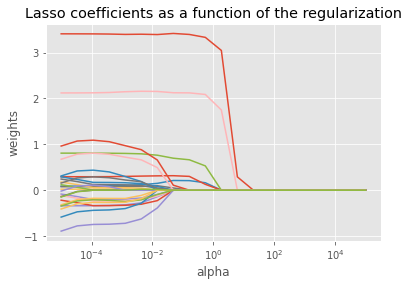

In [21]:
# Plot evolution of coefficients with different values of alpha
ax = plt.gca()
ax.plot(param['Lasso_model__alpha'], coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Lasso coefficients as a function of the regularization')
plt.axis('tight')
plt.show()

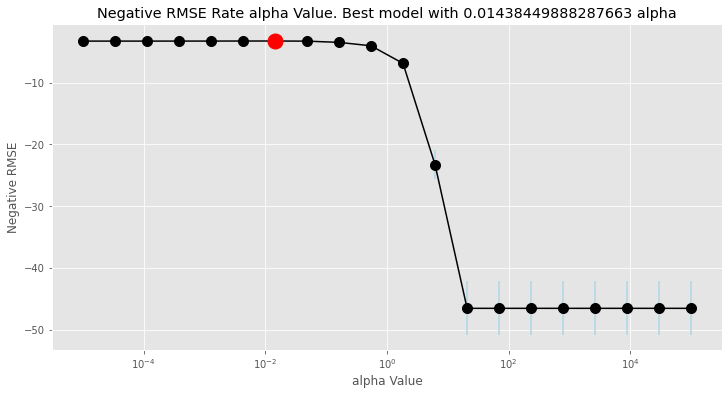

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['TMAX230',
                                                                          'TMAX229',
                                                                          'TMAX237',
                                                                          'TMAX417',
                                                                          'TMAX2969',
                                                                          'TMAX3910',
                                                                          'TMAX3918',
                                                                          'TMAX3959']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        str...
             param_grid={'ElasticNet_model__alpha': array([1.00000000e-05, 3.35981829e-05, 1.12883789e-04, 3.79269019e-04,
       1.27427499e-03, 4.28133240e-03, 1.43844989e-02, 4.83293024e-02,
       1.62377674e-01, 5.45559478e-01, 1.83298071e+00, 6.15848211e+00,
       2.06913808e+01, 6.95192796e+01, 2.33572147e+02, 7.84759970e+02,
       2.63665090e+03, 8.85866790e+03, 2.97635144e+04, 1.00000000e+05])},
             scoring='neg_mean_squared_error')

In [22]:
#-------------------------------------------------------------------------------------------------
#-------------------------------- ElasticNet Regression MODEL ------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
# numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = X_train.select_dtypes(include=['category']).columns.values.tolist()
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])

param = {'ElasticNet_model__alpha':np.logspace(-5, 5, 20)} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('ElasticNet_model', ElasticNet())
        ])
# As we want to know how the coefficients evolve with alpha, we have to do the grid ourselves first
nFolds = 10
coefs = []
for alpha in param['ElasticNet_model__alpha']:
    param_iter = {'ElasticNet_model__alpha': [alpha]}
    ElasticNet_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                        param_grid=param_iter, # Defined grid to search in
                        n_jobs=-1, # Number of cores to use (parallelize)
                        scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                        cv=nFolds) # Number of Folds 
    ElasticNet_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid
    coefs.append(ElasticNet_fit.best_estimator_[1].coef_)

# Train the model with the whole grid in order to obtain the cross validation errors easily
ElasticNet_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
ElasticNet_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
nFolds = 10
cv_errors = np.empty([nFolds,len(ElasticNet_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = ElasticNet_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_ELN = meanAcc # Store cv-scores for later

plt.figure(figsize=(12, 6))
plt.plot(ElasticNet_fit.cv_results_['param_ElasticNet_model__alpha'], meanAcc, marker='o', markersize=10, color='black')
plt.errorbar(ElasticNet_fit.cv_results_['param_ElasticNet_model__alpha'], meanAcc, yerr=stdAcc, linestyle="None", ecolor='lightblue')
plt.plot(ElasticNet_fit.best_params_['ElasticNet_model__alpha'], ElasticNet_fit.best_score_,marker='o', markersize=15, color='red')
plt.title('Negative RMSE Rate alpha Value. Best model with ' + str(ElasticNet_fit.best_params_['ElasticNet_model__alpha']) + ' alpha')
plt.xlabel('alpha Value')
plt.ylabel('Negative RMSE')
plt.xscale('log')
plt.show()
ElasticNet_fit

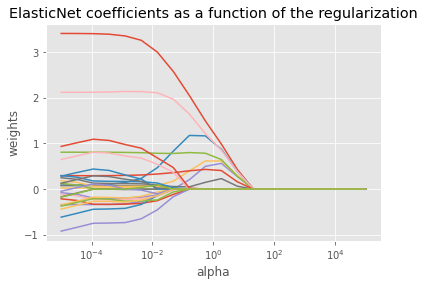

In [23]:
# Plot evolution of coefficients with different values of alpha
ax = plt.gca()
ax.plot(param['ElasticNet_model__alpha'], coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('ElasticNet coefficients as a function of the regularization')
plt.axis('tight')
plt.show()

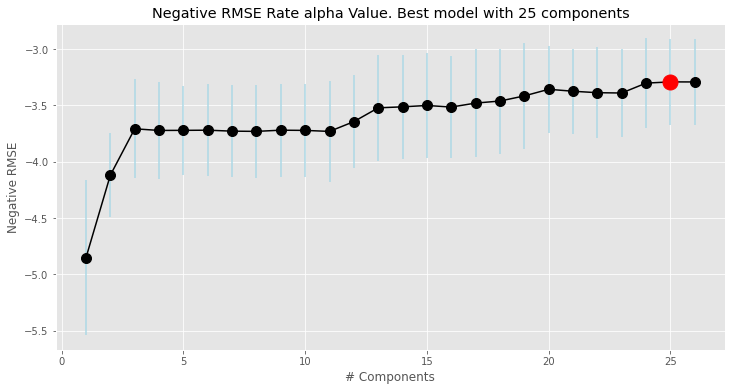

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['TMAX230',
                                                                          'TMAX229',
                                                                          'TMAX237',
                                                                          'TMAX417',
                                                                          'TMAX2969',
                                                                          'TMAX3910',
                                                                          'TMAX3918',
                                                                          'TMAX3959']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['WEEKDAY',
                                                                          'MONTH'])])),
                                       ('pca', PCA()),
                                       ('LR_model', LinearRegression())]),
             n_jobs=-1, param_grid={'pca__n_components': range(1, 27)},
             scoring='neg_mean_squared_error')

In [24]:
#-------------------------------------------------------------------------------------------------
#------------------------- Dimension reduction methods - PCR -------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
# numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = X_train.select_dtypes(include=['category']).columns.values.tolist()
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])
# Obtain names of the inputs
if X_train.select_dtypes('category').shape[1] > 0:
    input_names = []
    for cat_input in X_train.select_dtypes('category').columns:
        input_names += [cat_input + str(cat) for cat in X_train[cat_input].unique()]
    coefnames = X_train.select_dtypes(exclude='category').columns.values.tolist() + input_names
else:
    coefnames = X_train.columns.values.tolist()
param = {'pca__n_components': range(1,len(coefnames))} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('pca', PCA()),
            ('LR_model', LinearRegression())
        ])

# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
PCR_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
PCR_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
cv_errors = np.empty([nFolds,len(PCR_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = PCR_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_PCR = meanAcc # Store cv-scores for later

plt.figure(figsize=(12, 6))
plt.plot(PCR_fit.cv_results_['param_pca__n_components'], meanAcc, marker='o', markersize=10, color='black')
plt.errorbar(PCR_fit.cv_results_['param_pca__n_components'], meanAcc, yerr=stdAcc, linestyle="None", ecolor='lightblue')
plt.plot(PCR_fit.best_params_['pca__n_components'], PCR_fit.best_score_,marker='o', markersize=15, color='red')
plt.title('Negative RMSE Rate alpha Value. Best model with ' + str(PCR_fit.best_params_['pca__n_components']) + ' components')
plt.xlabel('# Components')
plt.ylabel('Negative RMSE')
plt.show()
PCR_fit

In [25]:
# Print the PCs
loadings = pd.DataFrame(PCR_fit.best_estimator_[1].components_.T * np.sqrt(PCR_fit.best_estimator_[1].explained_variance_), columns=['PC' + str(pca + 1) for pca in range(PCR_fit.best_params_['pca__n_components'])], index=coefnames)
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25
TMAX230,0.943186,-0.215189,-0.216280,-0.040713,0.003418,-0.018072,-0.006273,0.014746,-0.006572,-0.012856,...,0.008851,0.022199,0.007495,-0.014613,0.010707,0.001038,0.016836,-0.000594,-0.111972,0.008360
TMAX229,0.938194,-0.170450,-0.269148,-0.038017,-0.000999,0.004097,-0.019626,0.010135,-0.007523,-0.002149,...,-0.003844,-0.025478,0.015352,-0.039861,-0.004409,-0.009302,-0.021746,-0.063090,0.087257,-0.014914
TMAX237,0.930987,-0.129860,0.207617,-0.067918,-0.070300,-0.052836,0.000867,-0.003539,0.011861,0.018656,...,-0.059230,-0.041686,0.026106,-0.061177,0.014325,-0.041348,0.020190,-0.000985,0.007324,-0.001655
TMAX417,0.836090,0.509842,0.006203,0.002869,0.009739,0.010339,-0.023532,0.013171,0.020940,0.038620,...,-0.002460,0.003471,-0.037563,-0.081829,0.069708,0.008841,0.024490,0.017582,-0.004254,0.001087
TMAX2969,0.934719,-0.137457,0.190391,-0.126958,0.060802,0.044076,-0.012841,0.011906,0.037499,0.012306,...,0.021650,0.041937,-0.056566,0.010918,-0.106223,0.032976,0.060086,-0.014230,-0.001003,-0.006171
TMAX3910,0.905301,-0.093476,0.060805,0.402330,-0.021216,-0.003548,0.007885,-0.027974,-0.028072,0.007009,...,0.035223,-0.017849,-0.006861,0.022717,0.000359,0.010874,0.007657,0.001070,-0.000600,0.001551
TMAX3918,0.956459,-0.093635,0.111352,-0.069713,0.033514,0.039325,0.024260,-0.005958,0.007128,-0.006067,...,-0.005476,0.035167,0.023749,0.072318,0.102551,0.014287,-0.090300,0.040437,0.014661,-0.012395
TMAX3959,0.876951,0.414578,-0.094273,-0.040300,-0.018547,-0.028801,0.024600,-0.008989,-0.033537,-0.047940,...,0.011059,-0.019880,0.026888,0.075892,-0.092260,-0.021425,-0.015580,0.030052,0.000702,-0.002040
WEEKDAY1,-0.016361,0.002320,-0.034198,-0.003356,-0.023939,-0.004801,-0.053139,0.019402,0.004621,0.328722,...,0.017621,0.008146,0.004418,0.004184,-0.010739,0.001612,-0.003405,0.005521,-0.000496,0.000394
WEEKDAY6,-0.006630,0.001103,-0.008021,0.020360,-0.101237,-0.145303,-0.055294,-0.001037,0.276659,-0.084045,...,-0.003325,-0.007167,-0.006647,0.006841,-0.005089,-0.005829,-0.010354,-0.000532,0.000040,-0.000006


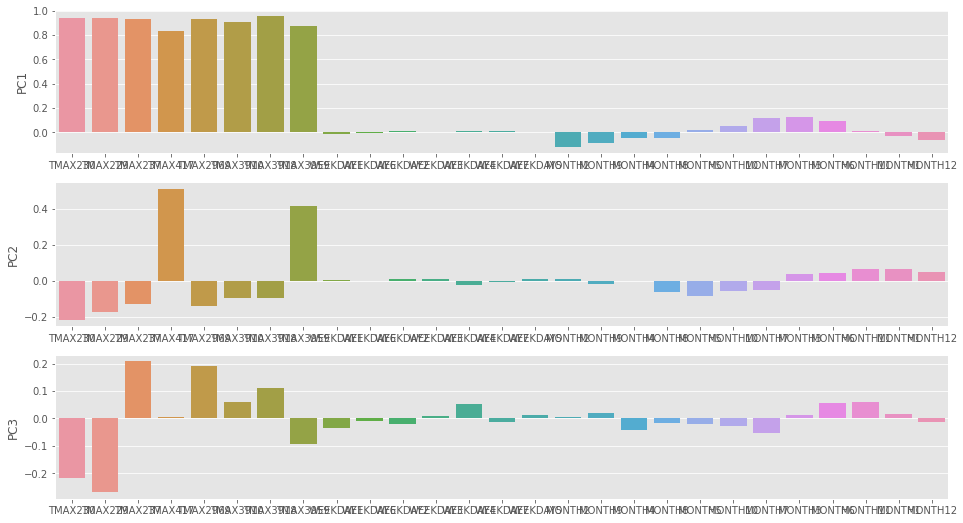

In [26]:
# Plot the 3 first PCs
# fig, axes = plt.subplots(loadings.shape[1], 1, figsize=(16,9))
fig, axes = plt.subplots(3, 1, figsize=(16,9))
PC = 0
for ax in axes.ravel():
    sns.barplot(data=loadings, x=loadings.index, y=loadings.columns.values.tolist()[PC], ax=ax)
    PC += 1

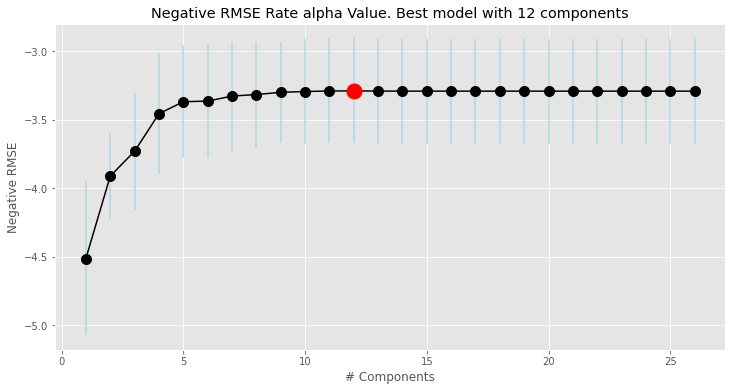

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['TMAX230',
                                                                          'TMAX229',
                                                                          'TMAX237',
                                                                          'TMAX417',
                                                                          'TMAX2969',
                                                                          'TMAX3910',
                                                                          'TMAX3918',
                                                                          'TMAX3959']),
                                                                        ('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['WEEKDAY',
                                                                          'MONTH'])])),
                                       ('PLSR_model', PLSRegression())]),
             n_jobs=-1, param_grid={'PLSR_model__n_components': range(1, 27)},
             scoring='neg_mean_squared_error')

In [27]:
#-------------------------------------------------------------------------------------------------
#------------------------- Dimension reduction methods - PLSR ------------------------------------
#-------------------------------------------------------------------------------------------------
# Prepare the numeric variables by imputing by its median and scaling
# numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_features = X_train.select_dtypes(include=['int64','float64']).columns.values.tolist()
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Prepare the categorical variables by imputing by last value and encoding the categories
categorical_features = X_train.select_dtypes(include=['category']).columns.values.tolist()
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Create a preprocessor to perform the steps defined above
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
        ])
# Obtain names of the inputs
if X_train.select_dtypes('category').shape[1] > 0:
    input_names = []
    for cat_input in X_train.select_dtypes('category').columns:
        input_names += [cat_input + str(cat) for cat in X_train[cat_input].unique()]
    coefnames = X_train.select_dtypes(exclude='category').columns.values.tolist() + input_names
else:
    coefnames = X_train.columns.values.tolist()
param = {'PLSR_model__n_components': range(1,len(coefnames))} 
pipe = Pipeline([
            ('preprocessor', preprocessor),
            ('PLSR_model', PLSRegression())
        ])

# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
PLSR_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='neg_mean_squared_error', # Negative RMSE https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
PLSR_fit.fit(X_train[numeric_features + categorical_features], y_train) # Search in grid

# Plot the cross validation score (accuracy) in the Grid Search
cv_errors = np.empty([nFolds,len(PLSR_fit.cv_results_['split0_test_score'])])
for split in range(nFolds):
    cv_errors[split,:] = PLSR_fit.cv_results_['split' + str(split) + '_test_score']
meanAcc = cv_errors.mean(0)
stdAcc = cv_errors.std(0)

scores_PLSR = meanAcc # Store cv-scores for later

plt.figure(figsize=(12, 6))
plt.plot(PLSR_fit.cv_results_['param_PLSR_model__n_components'], meanAcc, marker='o', markersize=10, color='black')
plt.errorbar(PLSR_fit.cv_results_['param_PLSR_model__n_components'], meanAcc, yerr=stdAcc, linestyle="None", ecolor='lightblue')
plt.plot(PLSR_fit.best_params_['PLSR_model__n_components'], PLSR_fit.best_score_,marker='o', markersize=15, color='red')
plt.title('Negative RMSE Rate alpha Value. Best model with ' + str(PLSR_fit.best_params_['PLSR_model__n_components']) + ' components')
plt.xlabel('# Components')
plt.ylabel('Negative RMSE')
plt.show()
PLSR_fit

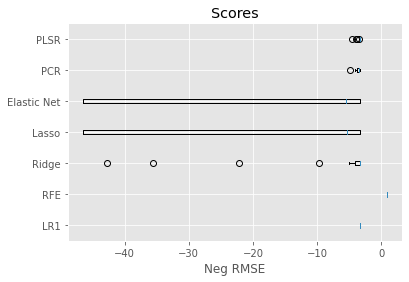

In [28]:
## Compare models
metric = 'Neg RMSE'
score = {'LR1': scores_LR1, 'RFE': scores_RFE, 'Ridge': scores_Ridge, 'Lasso': scores_Lasso, 'Elastic Net': scores_ELN, 'PCR': scores_PCR, 'PLSR': scores_PLSR}
RT.dotplot(score, metric)